# SETUP & INSTALLATION

In [1]:
# ============================================
# SETUP & INSTALLATION
# ============================================

# Install required packages
!pip install -q ultralytics roboflow

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import os
import glob
import random
import yaml
from pathlib import Path
from collections import Counter

# YOLO imports
from ultralytics import YOLO

# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)

# Verify environment
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU device: {torch.cuda.get_device_name(0)}")
else:
    print("⚠️ No GPU detected — training will be slow!")
    print("Go to: Runtime → Change runtime type → T4 GPU")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.6/94.6 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 49.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 35.4 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
PyTorch version: 2.10.0+cu128
CUDA available: True
GPU device: Tesla T4


# Download BCCD (Blood Cell Count and Detection)

In [9]:
from roboflow import Roboflow

rf = Roboflow(api_key="CkvqltJhCSp6mSqO8k69")
project = rf.workspace("bccd-vhdu3").project("blood-cell-cella-bccd-lihfn")
version = project.version(1)
dataset = version.download("yolov8")

DATASET_DIR = dataset.location
print(f"\n✅ Dataset downloaded and extracted to: {DATASET_DIR}")

loading Roboflow workspace...
loading Roboflow project...

✅ Dataset downloaded and extracted to: /content/Blood-Cell-Cella+BCCD-1


# Data Explaratory

In [11]:
# ============================================
# EXPLORE DATASET STRUCTURE
# ============================================

# Show directory tree
print("📂 Dataset Structure:")
print("=" * 50)
for root, dirs, files in os.walk(DATASET_DIR):
    level = root.replace(DATASET_DIR, '').count(os.sep)
    indent = '  ' * level
    folder_name = os.path.basename(root)
    if level <= 2:
        n_files = len(files)
        print(f"{indent}📁 {folder_name}/ ({n_files} files)")

# Count images per split
print("\n📊 Dataset Statistics:")
print("=" * 50)
for split in ['train', 'valid', 'test']:
    img_dir = os.path.join(DATASET_DIR, split, 'images')
    if os.path.exists(img_dir):
        n_images = len(glob.glob(os.path.join(img_dir, '*')))
        print(f"  {split:>8}: {n_images} images")

# Read and display data.yaml
yaml_path = os.path.join(DATASET_DIR, 'data.yaml')
with open(yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)

print(f"\n📋 data.yaml Configuration:")
print("=" * 50)
for key, value in data_config.items():
    print(f"  {key}: {value}")

📂 Dataset Structure:
📁 Blood-Cell-Cella+BCCD-1/ (3 files)
  📁 train/ (1 files)
    📁 labels/ (377 files)
    📁 images/ (377 files)
  📁 valid/ (1 files)
    📁 labels/ (110 files)
    📁 images/ (110 files)
  📁 test/ (0 files)
    📁 labels/ (53 files)
    📁 images/ (53 files)

📊 Dataset Statistics:
     train: 377 images
     valid: 110 images
      test: 53 images

📋 data.yaml Configuration:
  names: ['Platelets', 'RBC', 'WBC']
  nc: 3
  roboflow: {'license': 'CC BY 4.0', 'project': 'blood-cell-cella-bccd-lihfn', 'url': 'https://universe.roboflow.com/bccd-vhdu3/blood-cell-cella-bccd-lihfn/dataset/1', 'version': 1, 'workspace': 'bccd-vhdu3'}
  test: ../test/images
  train: ../train/images
  val: ../valid/images


# Understand YOLO Annotation Format

In [12]:
# ============================================
# EXPLORE YOLO ANNOTATION FORMAT
# ============================================

# Get class names from data.yaml
class_names = data_config['names']
print(f"🏷️ Classes in this dataset:")
for i, name in enumerate(class_names):
    print(f"  {i}: {name}")

# Pick sample images from training set
train_img_dir = os.path.join(DATASET_DIR, 'train', 'images')
train_lbl_dir = os.path.join(DATASET_DIR, 'train', 'labels')
sample_images = sorted(glob.glob(os.path.join(train_img_dir, '*')))[:5]

# Show raw annotation file contents
for img_path in sample_images[:2]:
    img_name = os.path.splitext(os.path.basename(img_path))[0]
    label_path = os.path.join(train_lbl_dir, img_name + '.txt')

    print(f"\n📄 Image: {os.path.basename(img_path)}")
    print(f"📄 Label: {os.path.basename(label_path)}")
    print("─" * 65)

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()
        print(f"  Objects in this image: {len(lines)}")
        print(f"  {'class_id':<10} {'x_center':<10} {'y_center':<10} "
              f"{'width':<10} {'height':<10} {'class_name'}")
        print(f"  {'─' * 60}")
        for line in lines:
            parts = line.strip().split()
            cls_id = int(parts[0])
            x_c, y_c, w, h = [float(p) for p in parts[1:]]
            name = class_names[cls_id] if cls_id < len(class_names) else 'unknown'
            print(f"  {cls_id:<10} {x_c:<10.4f} {y_c:<10.4f} "
                  f"{w:<10.4f} {h:<10.4f} {name}")
    else:
        print("  ⚠️ No label file found")

🏷️ Classes in this dataset:
  0: Platelets
  1: RBC
  2: WBC

📄 Image: BloodImage_00045_jpg.rf.27ac555b7ff4134fdff854408be866c9.jpg
📄 Label: BloodImage_00045_jpg.rf.27ac555b7ff4134fdff854408be866c9.txt
─────────────────────────────────────────────────────────────────
  Objects in this image: 24
  class_id   x_center   y_center   width      height     class_name
  ────────────────────────────────────────────────────────────
  1          0.4344     0.4875     0.1500     0.2146     RBC
  1          0.3281     0.1917     0.1500     0.2146     RBC
  1          0.8484     0.7188     0.1500     0.1708     RBC
  1          0.3453     0.6729     0.1500     0.2146     RBC
  1          0.6859     0.2958     0.1547     0.2167     RBC
  1          0.6203     0.9146     0.1500     0.1708     RBC
  1          0.4234     0.6750     0.1500     0.2146     RBC
  1          0.7797     0.7917     0.1500     0.1708     RBC
  1          0.6781     0.8896     0.1500     0.1708     RBC
  1          0.4562     

# Visualize Annotations on Images

In [13]:
# ============================================
# HELPER: Convert YOLO format to pixel coordinates
# ============================================

def yolo_to_pixel(x_center, y_center, width, height, img_w, img_h):
    """
    Convert YOLO normalized coordinates to pixel coordinates.
    YOLO: (x_center, y_center, width, height) — all 0 to 1
    Pixel: (x1, y1, x2, y2) — top-left and bottom-right corners
    """
    x1 = (x_center - width / 2) * img_w
    y1 = (y_center - height / 2) * img_h
    x2 = (x_center + width / 2) * img_w
    y2 = (y_center + height / 2) * img_h
    return x1, y1, x2, y2


def visualize_yolo_annotations(img_path, label_path, class_names, ax=None):
    """Draw YOLO bounding boxes on an image."""
    img = Image.open(img_path)
    img_w, img_h = img.size

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    ax.imshow(img)
    colors = plt.cm.Set1(np.linspace(0, 1, max(len(class_names), 1)))

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                cls_id = int(parts[0])
                x_c, y_c, w, h = [float(p) for p in parts[1:]]
                x1, y1, x2, y2 = yolo_to_pixel(x_c, y_c, w, h, img_w, img_h)

                color = colors[cls_id % len(colors)]
                rect = patches.Rectangle(
                    (x1, y1), x2 - x1, y2 - y1,
                    linewidth=2, edgecolor=color, facecolor='none'
                )
                ax.add_patch(rect)

                name = class_names[cls_id] if cls_id < len(class_names) else f'cls_{cls_id}'
                ax.text(x1, y1 - 5, name, fontsize=10, fontweight='bold',
                       color='white',
                       bbox=dict(boxstyle='round,pad=0.2',
                                 facecolor=color, alpha=0.8))
    ax.axis('off')
    return ax

print("✅ Helper functions defined.")

✅ Helper functions defined.


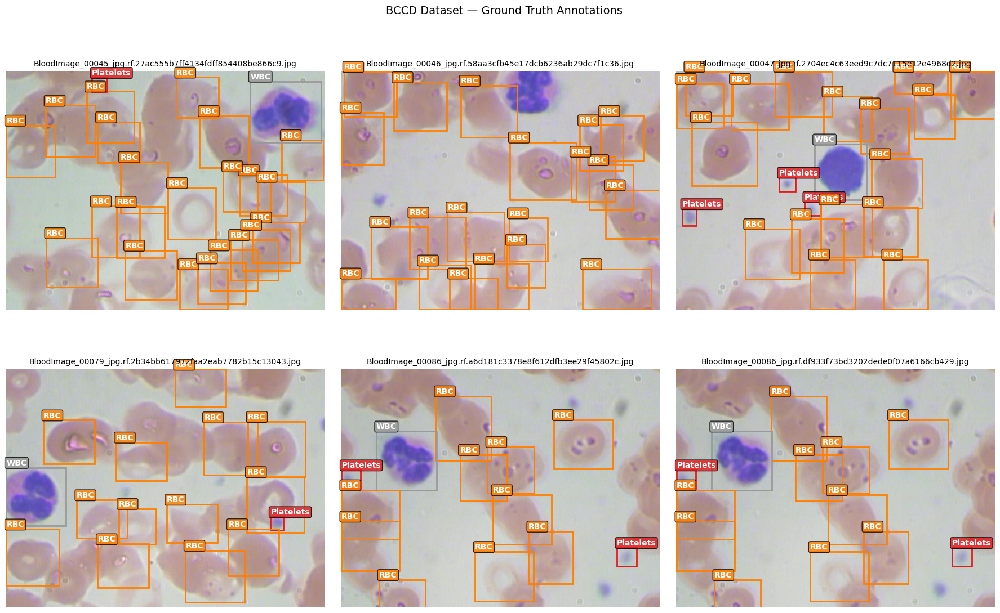

In [14]:
# ============================================
# VISUALIZE ANNOTATIONS ON SAMPLE IMAGES
# ============================================

# Find images that have annotations
annotated_samples = []
for img_path in sorted(glob.glob(os.path.join(train_img_dir, '*'))):
    img_name = os.path.splitext(os.path.basename(img_path))[0]
    label_path = os.path.join(train_lbl_dir, img_name + '.txt')
    if os.path.exists(label_path) and os.path.getsize(label_path) > 0:
        annotated_samples.append((img_path, label_path))
    if len(annotated_samples) >= 6:
        break

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
for idx, (img_path, label_path) in enumerate(annotated_samples):
    ax = axes[idx // 3, idx % 3]
    visualize_yolo_annotations(img_path, label_path, class_names, ax=ax)
    ax.set_title(os.path.basename(img_path), fontsize=10)

plt.suptitle('BCCD Dataset — Ground Truth Annotations', fontsize=14)
plt.tight_layout()
plt.show()

# Dataset Statistics

📊 Training Set Statistics:
  Images with annotations: 377
  Total objects: 6192
  Avg objects/image: 16.4
  Max objects in one image: 27

🏷️ Objects per Class:
  RBC                   5590  ██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

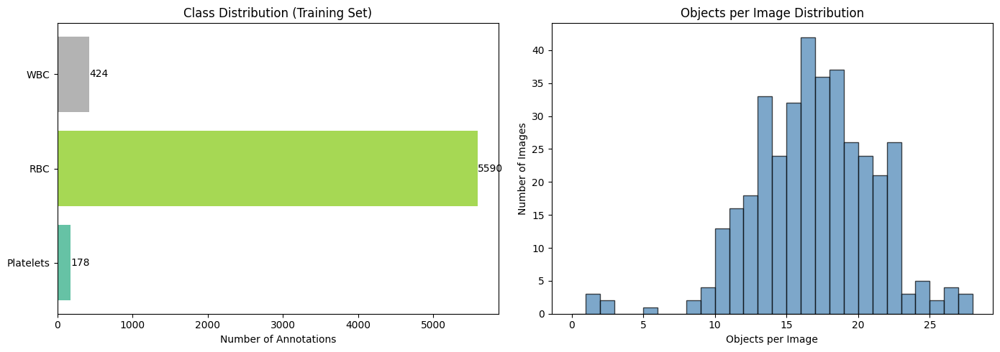

In [15]:
# ============================================
# DATASET STATISTICS
# ============================================

# Count objects per class across training set
class_counter = {name: 0 for name in class_names}
total_objects = 0
objects_per_image = []

for label_path in glob.glob(os.path.join(train_lbl_dir, '*.txt')):
    with open(label_path, 'r') as f:
        lines = f.readlines()
    objects_per_image.append(len(lines))
    for line in lines:
        cls_id = int(line.strip().split()[0])
        if cls_id < len(class_names):
            class_counter[class_names[cls_id]] += 1
        total_objects += 1

print("📊 Training Set Statistics:")
print("=" * 50)
print(f"  Images with annotations: {len(objects_per_image)}")
print(f"  Total objects: {total_objects}")
print(f"  Avg objects/image: {np.mean(objects_per_image):.1f}")
print(f"  Max objects in one image: {max(objects_per_image) if objects_per_image else 0}")
print(f"\n🏷️ Objects per Class:")
for name, count in sorted(class_counter.items(), key=lambda x: -x[1]):
    bar = '█' * (count // 5)
    print(f"  {name:<20} {count:>5}  {bar}")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

names_list = list(class_counter.keys())
counts_list = list(class_counter.values())
colors = plt.cm.Set2(np.linspace(0, 1, len(names_list)))
axes[0].barh(names_list, counts_list, color=colors)
axes[0].set_xlabel('Number of Annotations')
axes[0].set_title('Class Distribution (Training Set)')
for i, (n, c) in enumerate(zip(names_list, counts_list)):
    axes[0].text(c + 2, i, str(c), va='center', fontsize=10)

axes[1].hist(objects_per_image,
             bins=range(0, max(objects_per_image) + 2),
             edgecolor='black', alpha=0.7, color='steelblue')
axes[1].set_xlabel('Objects per Image')
axes[1].set_ylabel('Number of Images')
axes[1].set_title('Objects per Image Distribution')

plt.tight_layout()
plt.show()

# Train the Model

In [16]:
# ============================================
# FINE-TUNE YOLO26
# ============================================

# but for detection. Key parameters to explain:
# - epochs: passes through training data
# - imgsz: YOLO resizes all images to this
# - batch: adjust if GPU memory errors (try 8)
# - patience: early stopping

model = YOLO('yolo26n.pt')

results = model.train(
    data=os.path.join(DATASET_DIR, 'data.yaml'),
    epochs=30,        # Low for class; use 50+ for real projects
    imgsz=640,        # Standard YOLO input size
    batch=16,         # Reduce to 8 if memory error
    patience=10,       # Early stopping
    lr0=0.001,         # Initial learning rate
    verbose=True,
    project='runs',
    name='BCCD',
    exist_ok=True,
)

# Capture the actual save directory for use in later cells
SAVE_DIR = str(results.save_dir)
print(f"\n✅ Training complete! Results saved to: {SAVE_DIR}")

Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Blood-Cell-Cella+BCCD-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=BCCD, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, 

# Visualize Training Curves

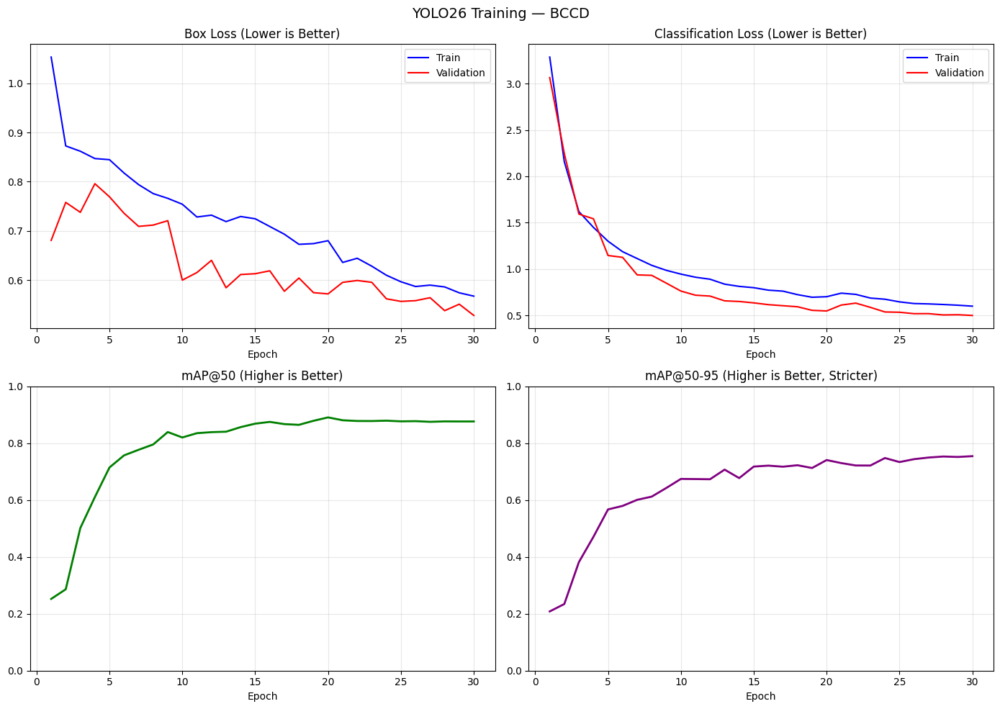


📊 Final Metrics:
  mAP@50:    0.8767
  mAP@50-95: 0.7546
  Box loss:  0.5280
  Cls loss:  0.4986


In [17]:
# ============================================
# VISUALIZE TRAINING CURVES
# ============================================

import pandas as pd

results_csv = os.path.join(SAVE_DIR, 'results.csv')
if os.path.exists(results_csv):
    df = pd.read_csv(results_csv)
    df.columns = df.columns.str.strip()

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # Box loss
    axes[0, 0].plot(df['epoch'], df['train/box_loss'],
                     label='Train', color='blue')
    axes[0, 0].plot(df['epoch'], df['val/box_loss'],
                     label='Validation', color='red')
    axes[0, 0].set_title('Box Loss (Lower is Better)')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # Classification loss
    axes[0, 1].plot(df['epoch'], df['train/cls_loss'],
                     label='Train', color='blue')
    axes[0, 1].plot(df['epoch'], df['val/cls_loss'],
                     label='Validation', color='red')
    axes[0, 1].set_title('Classification Loss (Lower is Better)')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # mAP50
    axes[1, 0].plot(df['epoch'], df['metrics/mAP50(B)'],
                     color='green', linewidth=2)
    axes[1, 0].set_title('mAP@50 (Higher is Better)')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylim(0, 1)
    axes[1, 0].grid(True, alpha=0.3)

    # mAP50-95
    axes[1, 1].plot(df['epoch'], df['metrics/mAP50-95(B)'],
                     color='purple', linewidth=2)
    axes[1, 1].set_title('mAP@50-95 (Higher is Better, Stricter)')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylim(0, 1)
    axes[1, 1].grid(True, alpha=0.3)

    plt.suptitle('YOLO26 Training — BCCD', fontsize=14)
    plt.tight_layout()
    plt.show()

    # Print final metrics
    last = df.iloc[-1]
    print("\n📊 Final Metrics:")
    print("=" * 40)
    print(f"  mAP@50:    {last['metrics/mAP50(B)']:.4f}")
    print(f"  mAP@50-95: {last['metrics/mAP50-95(B)']:.4f}")
    print(f"  Box loss:  {last['val/box_loss']:.4f}")
    print(f"  Cls loss:  {last['val/cls_loss']:.4f}")
else:
    print("⚠️ results.csv not found.")

# Evaluate on Validation Set

In [19]:
# ============================================
# EVALUATE ON VALIDATION SET
# ============================================

best_model = YOLO(os.path.join(SAVE_DIR, 'weights', 'best.pt'))

val_results = best_model.val(
    data=os.path.join(DATASET_DIR, 'data.yaml'),
    verbose=True
)

print("\n📊 Validation Results:")
print("=" * 50)
print(f"  mAP@50:    {val_results.box.map50:.4f}")
print(f"  mAP@50-95: {val_results.box.map:.4f}")
print(f"  Precision: {val_results.box.mp:.4f}")
print(f"  Recall:    {val_results.box.mr:.4f}")

print(f"\n🏷️ Per-Class mAP@50:")
print(f"  {'Class':<20} {'mAP@50':<10}")
print(f"  {'─' * 30}")
for i, name in enumerate(class_names):
    if i < len(val_results.box.ap50):
        print(f"  {name:<20} {val_results.box.ap50[i]:.4f}")

Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n summary (fused): 122 layers, 2,375,421 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 518.7±217.9 MB/s, size: 14.3 KB)
val: Scanning /content/Blood-Cell-Cella+BCCD-1/valid/labels.cache... 110 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 110/110 38.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.7s
                   all        110       1812      0.815       0.82      0.876      0.754
             Platelets         35         63      0.731      0.689      0.773      0.581
                   RBC        110       1627      0.827      0.876      0.931      0.827
                   WBC        108        122      0.886      0.895      0.925      0.856
Speed: 8.3ms preprocess, 6.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /content/runs/detect/va

Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.3±0.7 ms, read: 284.3±174.1 MB/s, size: 15.1 KB)
val: Scanning /content/Blood-Cell-Cella+BCCD-1/valid/labels.cache... 110 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 110/110 30.8Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.9it/s 3.8s
                   all        110       1812      0.815       0.82      0.876      0.754
             Platelets         35         63      0.731      0.689      0.773      0.581
                   RBC        110       1627      0.827      0.876      0.931      0.827
                   WBC        108        122      0.886      0.895      0.925      0.856
Speed: 4.1ms preprocess, 7.3ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /content/runs/detect/val9


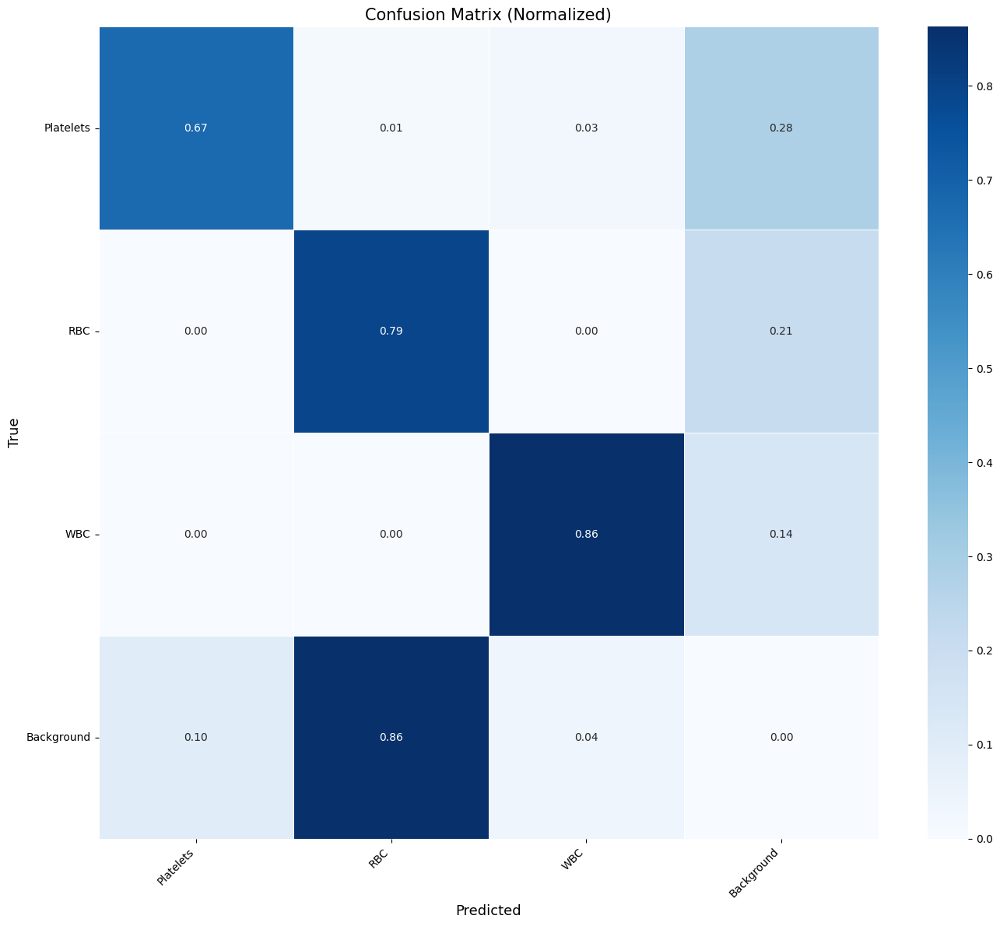

In [27]:
import seaborn as sns
import numpy as np

val_results = best_model.val(data=os.path.join(DATASET_DIR, 'data.yaml'), verbose=True)

matrix = val_results.confusion_matrix.matrix  # numpy array

matrix_norm = matrix / (matrix.sum(axis=1, keepdims=True) + 1e-9)
labels = class_names + ['Background']

plt.figure(figsize=(14, 12))
sns.heatmap(
    matrix_norm,
    annot=True,
    fmt='.2f',
    cmap='Blues',
    xticklabels=labels,
    yticklabels=labels,
    linewidths=0.5
)
plt.xlabel('Predicted', fontsize=13)
plt.ylabel('True', fontsize=13)
plt.title('Confusion Matrix (Normalized)', fontsize=15)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Predictions on Validation  Images

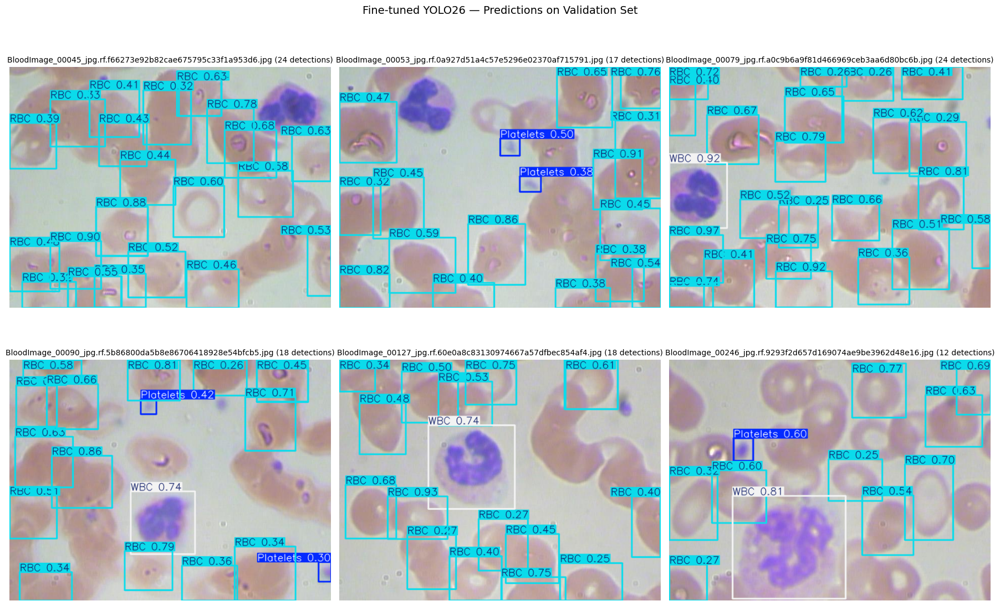

In [25]:
# ============================================
# PREDICTIONS ON VALIDATION IMAGES
# ============================================

val_img_dir = os.path.join(DATASET_DIR, 'valid', 'images')
val_images = sorted(glob.glob(os.path.join(val_img_dir, '*')))[:6]

pred_results = best_model(val_images, conf=0.25, verbose=False)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
for idx, (img_path, result) in enumerate(zip(val_images, pred_results)):
    ax = axes[idx // 3, idx % 3]
    annotated = result.plot()
    ax.imshow(annotated[..., ::-1])
    ax.set_title(f"{os.path.basename(img_path)} "
                 f"({len(result.boxes)} detections)", fontsize=10)
    ax.axis('off')

plt.suptitle('Fine-tuned YOLO26 — Predictions on Validation Set',
             fontsize=14)
plt.tight_layout()
plt.show()

# Visualize 6 prediction exampls on validation images

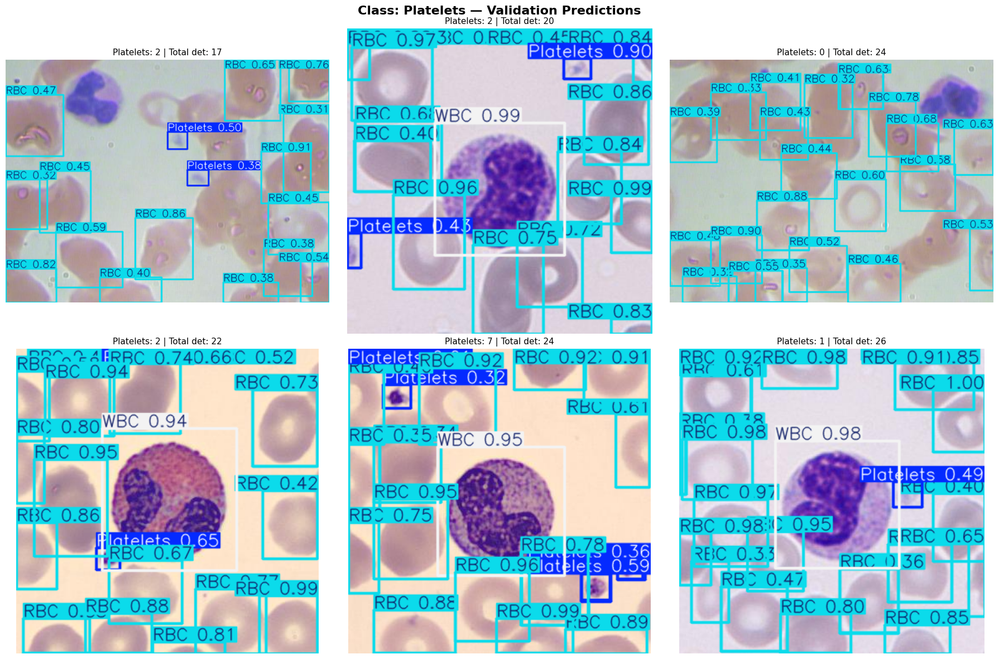

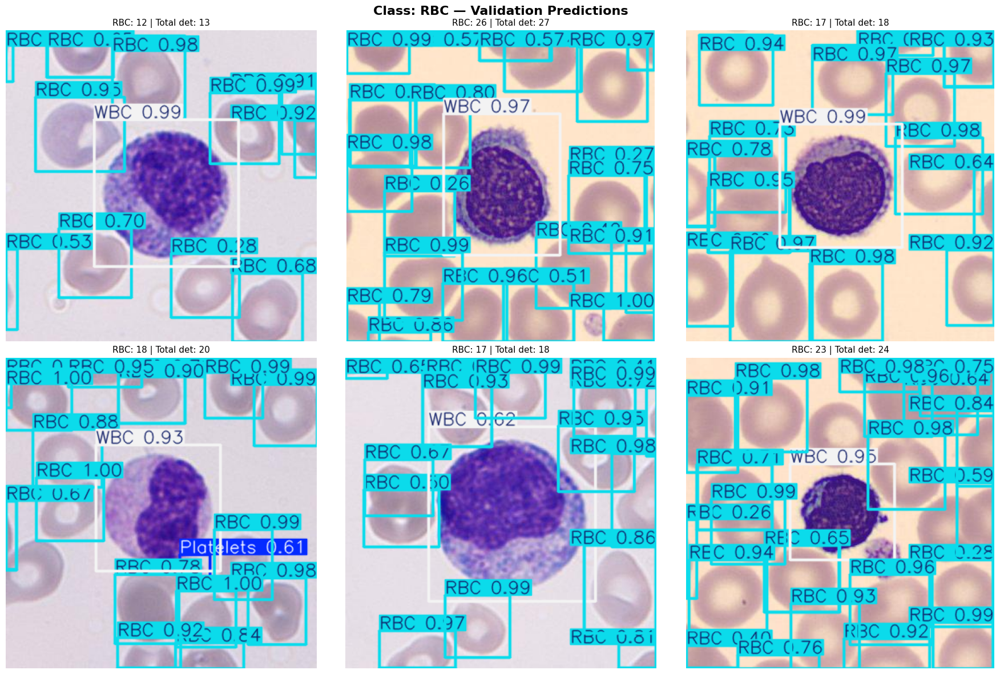

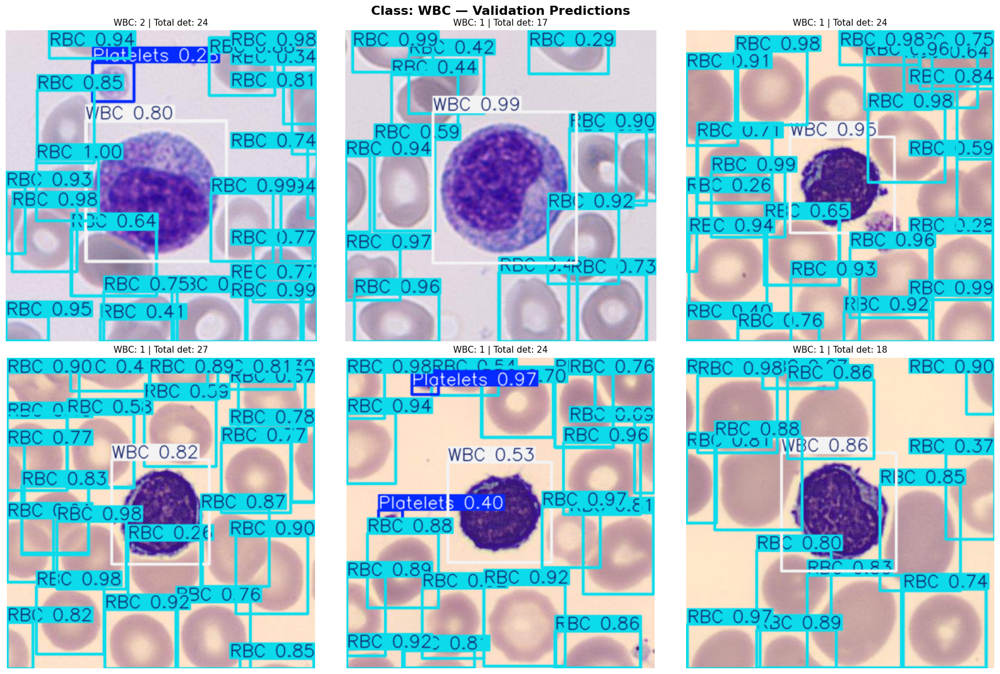

In [31]:
import random
from pathlib import Path
import glob

# ============================================
# 6 PREDICTION EXAMPLES PER CLASS
# ============================================

val_img_dir = os.path.join(DATASET_DIR, 'valid', 'images')
val_lbl_dir = os.path.join(DATASET_DIR, 'valid', 'labels')

# Group images by class
class_to_images = {name: [] for name in class_names}

for img_path in glob.glob(os.path.join(val_img_dir, '*')):
    lbl_path = os.path.join(val_lbl_dir, Path(img_path).stem + '.txt')
    if not os.path.exists(lbl_path):
        continue
    with open(lbl_path, 'r') as f:
        classes_in_image = set(int(line.split()[0]) for line in f.readlines() if line.strip())
    for cls_id in classes_in_image:
        if cls_id < len(class_names):
            class_to_images[class_names[cls_id]].append(img_path)

# Plot 6 images per class
for cls_name, images in class_to_images.items():
    if len(images) == 0:
        print(f"⚠️ No images found for class: {cls_name}")
        continue

    sample = random.sample(images, min(6, len(images)))

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, img_path in enumerate(sample):
        res = best_model(img_path, conf=0.25, verbose=False)
        plotted = res[0].plot()[..., ::-1]  # BGR to RGB

        # Count only detections for this specific class
        boxes = res[0].boxes
        cls_ids = boxes.cls.cpu().numpy().astype(int)
        target_cls_id = class_names.index(cls_name)
        cls_count = int((cls_ids == target_cls_id).sum())

        axes[idx].imshow(plotted)
        axes[idx].set_title(f"{cls_name}: {cls_count} | Total det: {len(boxes)}", fontsize=11)
        axes[idx].axis('off')

    # Hide unused axes if fewer than 6 images
    for i in range(len(sample), 6):
        axes[i].axis('off')

    plt.suptitle(f'Class: {cls_name} — Validation Predictions', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()